# Imports

In [1]:
import os
os.chdir('/mas/u/asma_gh/disco')

import tensorflow as tf
from tensorboard.backend.event_processing import event_accumulator
from test_explainer_discoverer import test
from utils import inverse_image, make3d
import yaml
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore") 

tf.__version__

/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/usr/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected

'1.12.3'

# Counterfactual Image Trajectories utils

In [2]:
def save_target_images(img, num_class, image_size=128,num_channel=3):
    img = make3d(img, num_channel=num_channel, image_size=image_size, row=1, col=num_class)                      
    img = inverse_image(img)
    return img

def view(img, num_samples, NUMS_CLASS, generation_dim, real_pred, FAKE_IMG, fake_pred, image_size, HAS_MAIN_DIM):
    img = inverse_image(img)
    start = 0
    fake_pred = np.round(fake_pred, decimals=2)
    for i in range(num_samples):
        plt.figure(figsize = (3,3))
        plt.imshow(img[i])
        plt.title(str(" Output of pre. cls: ") + str(real_pred[start][1]))
        plt.show()
        for j in range(generation_dim):
            plt.figure(figsize = (3 * NUMS_CLASS, 3))
            temp = save_target_images(FAKE_IMG[start+j*NUMS_CLASS:start+(j+1)*NUMS_CLASS], NUMS_CLASS, 
                                      image_size=image_size)
            if (HAS_MAIN_DIM and j == generation_dim-1) or generation_dim == 1:
                plt.title("Main Knob - ".format(j)+"Generated image cls output: " + str(
                    fake_pred[start+j*NUMS_CLASS:start+(j+1)*NUMS_CLASS][:, 1]))
            else:
                plt.title("Knob {} - ".format(j+1)+"Generated image cls output: " + str(
                    fake_pred[start+j*NUMS_CLASS:start+(j+1)*NUMS_CLASS][:, 1]))
            plt.imshow(temp)
            plt.show()

        start = start + NUMS_CLASS * generation_dim


# Tensorboard utils

In [3]:
def plot_tensorboard_summary(log_file_name):
    plt.figure()
    ea = event_accumulator.EventAccumulator(log_file_name,size_guidance={ 
        event_accumulator.COMPRESSED_HISTOGRAMS: 1,
        event_accumulator.IMAGES: 1,
        event_accumulator.AUDIO: 1,
        event_accumulator.SCALARS: 5000,
        event_accumulator.HISTOGRAMS: 1,
        })
    ea.Reload()
    scalars = sorted(ea.Tags()['scalars'])
    def plot(scalars, n_cols=4, subplot_size=5):
        n_rows = math.ceil(len(scalars)/n_cols)
        plt.figure(figsize=(subplot_size*n_cols, subplot_size*n_rows))
        counter = 1
        for counter, s in enumerate(scalars):
            plt.subplot(n_rows, n_cols, counter+1)
            df = pd.DataFrame(ea.Scalars(s))
            plt.scatter(x=df['step'], y=df['value'])
            plt.title(s)
        plt.show()
    plot(scalars)        

# Overall Utils

In [4]:
def view_images(config_path, num_samples, plot_tensorboard=True):
    tf.reset_default_graph()
    config = yaml.load(open(config_path))
    HAS_MAIN_DIM = 'main_dim' in config_path or 'plus' in config_path
    if HAS_MAIN_DIM:
        generation_dim = config['k_dim'] + 1
    else:
        generation_dim = config['k_dim']
        
    print('Support main dimension? {}'.format(HAS_MAIN_DIM))
    
    # Run explainer/discoverer and get outputs
    results_dict = test(config_path, dbg_mode=True, export_output=False, dbg_size=num_samples)

    # plot tensorboard summary
    if plot_tensorboard:
        log_dir = os.path.join(config['log_dir'], config['name'], 'log')
        all_files = sorted(os.listdir(log_dir))
        log_file_name = os.path.join(log_dir, all_files[-2])
        plot_tensorboard_summary(log_file_name)
        
    # plot image trajectories
    view(results_dict['real_imgs'], num_samples, config['num_bins'], generation_dim, results_dict['real_ps'], 
         results_dict['fake_t_imgs'], results_dict['fake_ps'], config['input_size'], HAS_MAIN_DIM)


# Visualizing Experiments Results

experiment with your config file of interest. To avoid stdout clutter, use %%capture --no-display at the begining of each cell.

## Shapes

Instructions for updating:
keep_dims is deprecated, use keepdims instead
INFO:tensorflow:Restoring parameters from ./output/discoverer/redshapes_experiments/shapes_redcolor_Explainer/ckpt_dir/model98000.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/shapes-redcolor/cp1_epoch4.ckpt


<Figure size 432x288 with 0 Axes>

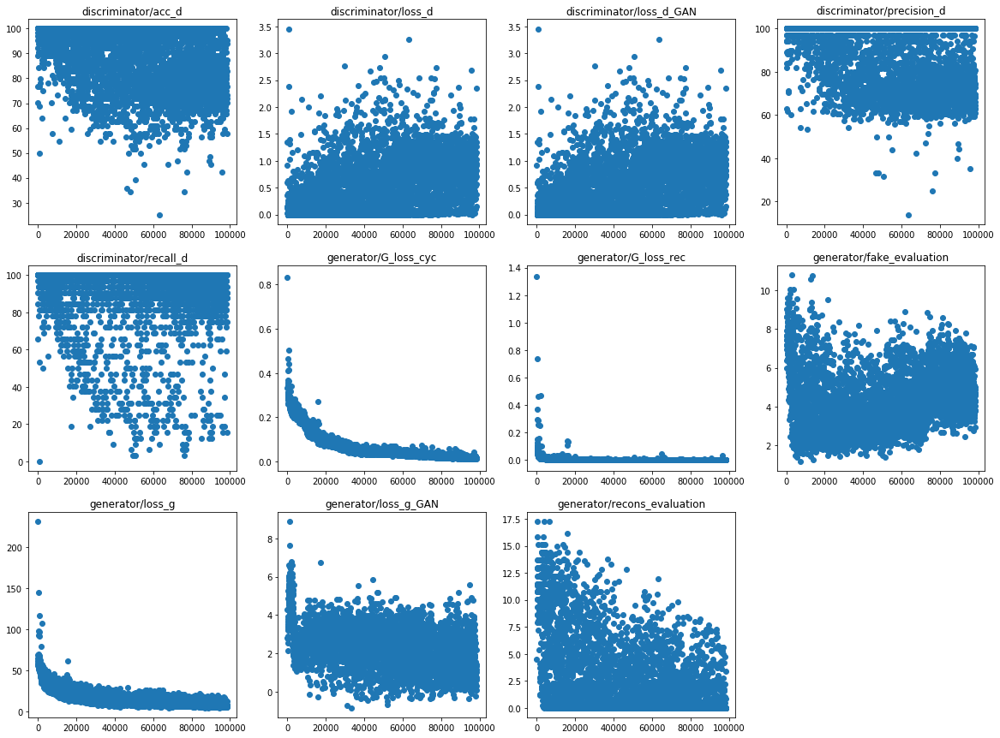

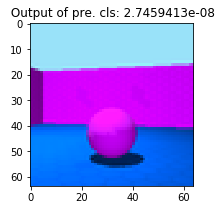

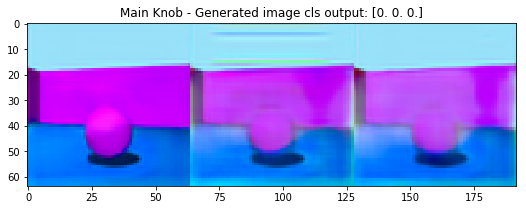

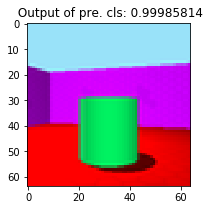

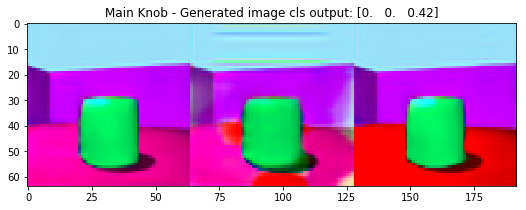

...

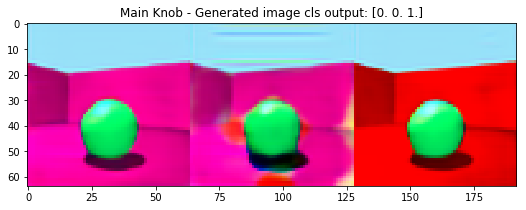

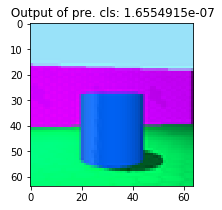

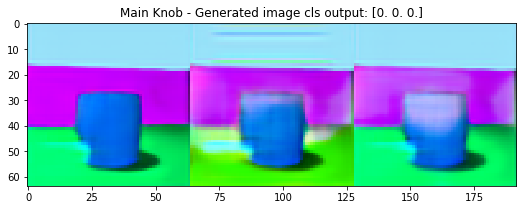

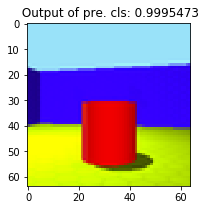

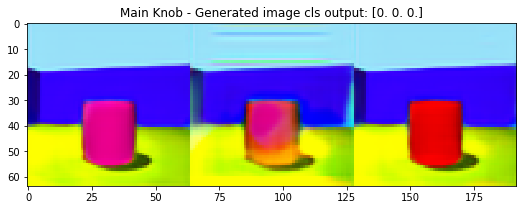

In [5]:
%%capture --no-display
view_images('./configs/redshapes_experiments/shapes_redcolor_Explainer.yaml', 8)

INFO:tensorflow:Restoring parameters from ./output/discoverer/redshapes_experiments/shapes_redcolor_Discoverer_2_dim_r_10/ckpt_dir/model84000.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/shapes-redcolor/cp1_epoch4.ckpt


<Figure size 432x288 with 0 Axes>

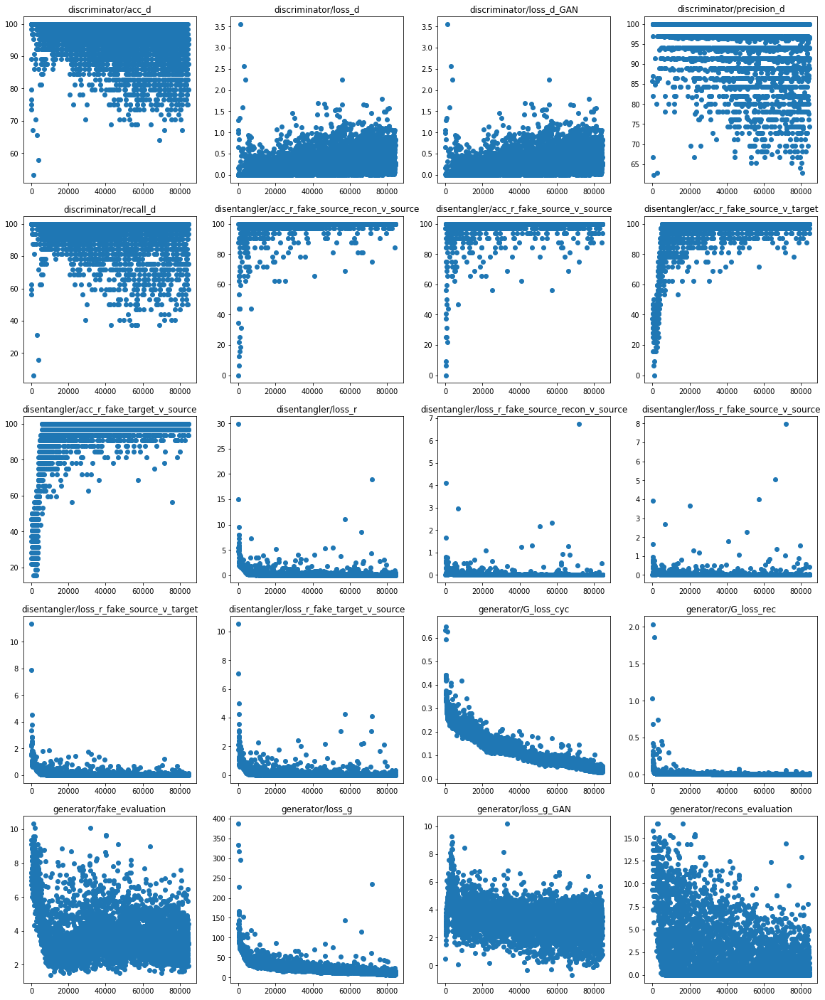

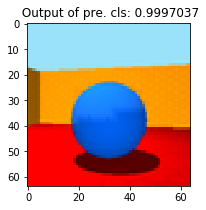

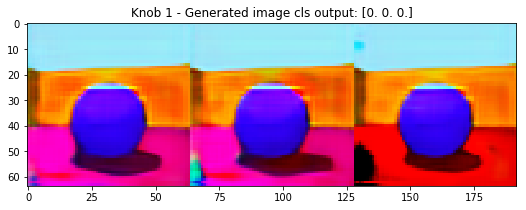

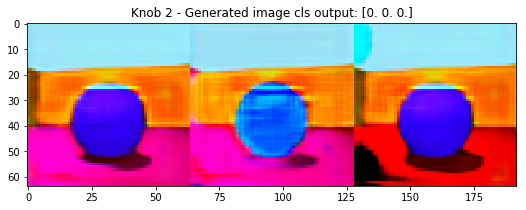

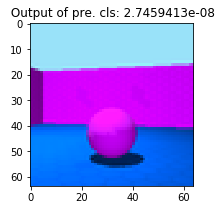

...

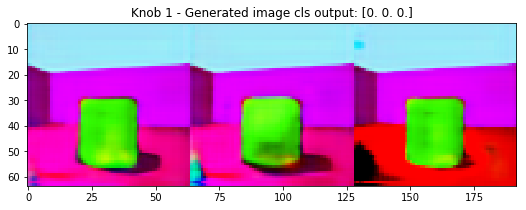

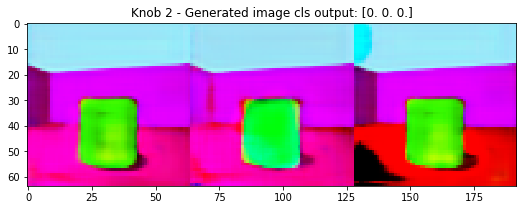

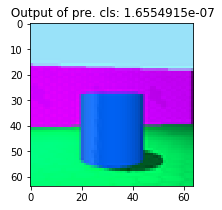

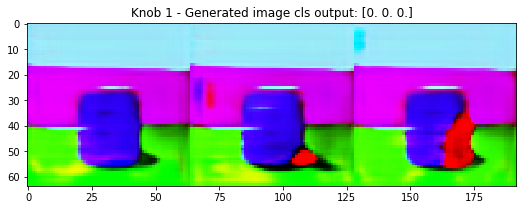

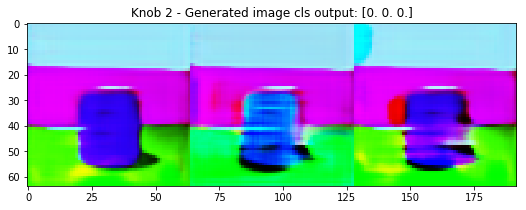

In [6]:
%%capture --no-display
view_images('./configs/redshapes_experiments/shapes_redcolor_Discoverer_2_dim_r_10.yaml', 8)

INFO:tensorflow:Restoring parameters from ./output/discoverer/redshapes_experiments/shapes_redcolor_Discoverer_2_dim_r_50/ckpt_dir/model84500.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/shapes-redcolor/cp1_epoch4.ckpt


<Figure size 432x288 with 0 Axes>

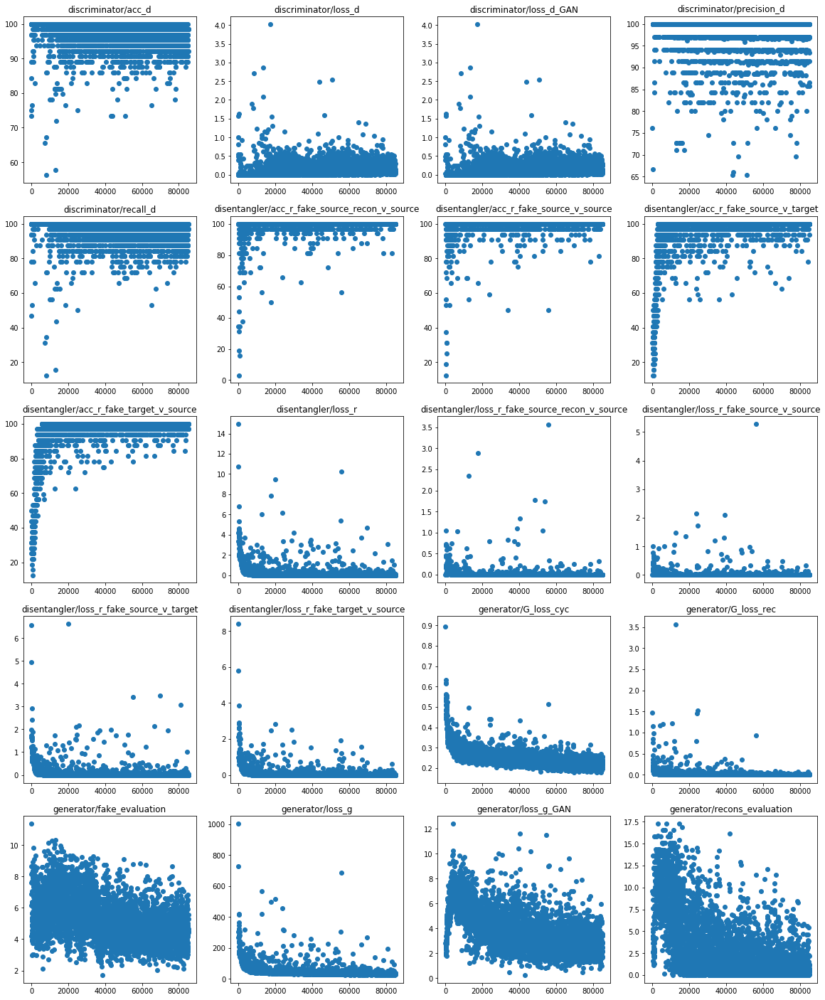

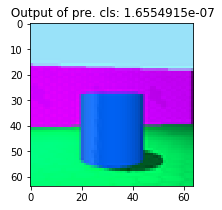

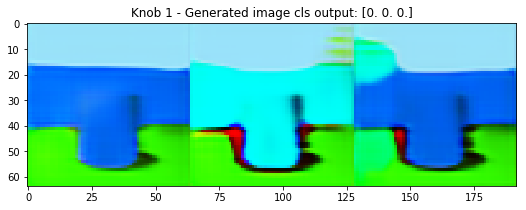

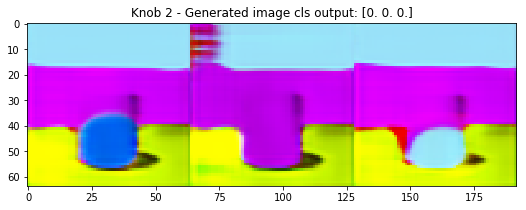

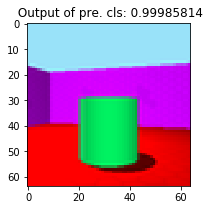

...

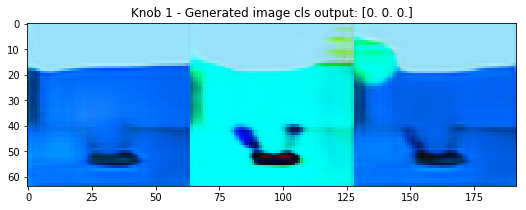

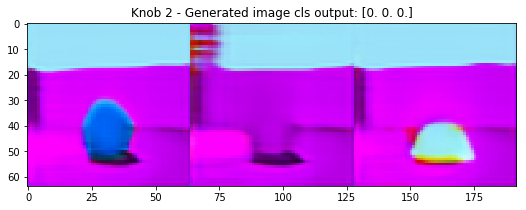

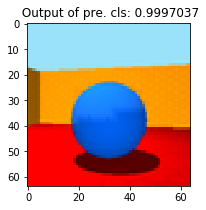

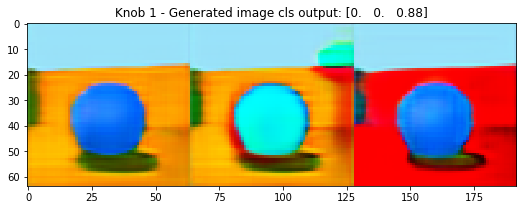

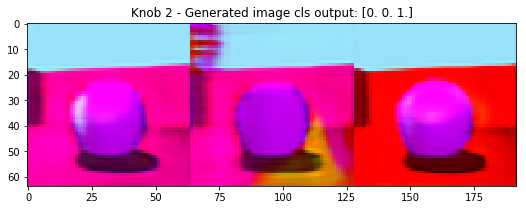

In [7]:
%%capture --no-display
view_images('./configs/redshapes_experiments/shapes_redcolor_Discoverer_2_dim_r_50.yaml', 8)

INFO:tensorflow:Restoring parameters from ./output/discoverer/redshapes_experiments/shapes_redcolor_Discoverer_2_dim_plus_r_10/ckpt_dir/model47500.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/shapes-redcolor/cp1_epoch4.ckpt


<Figure size 432x288 with 0 Axes>

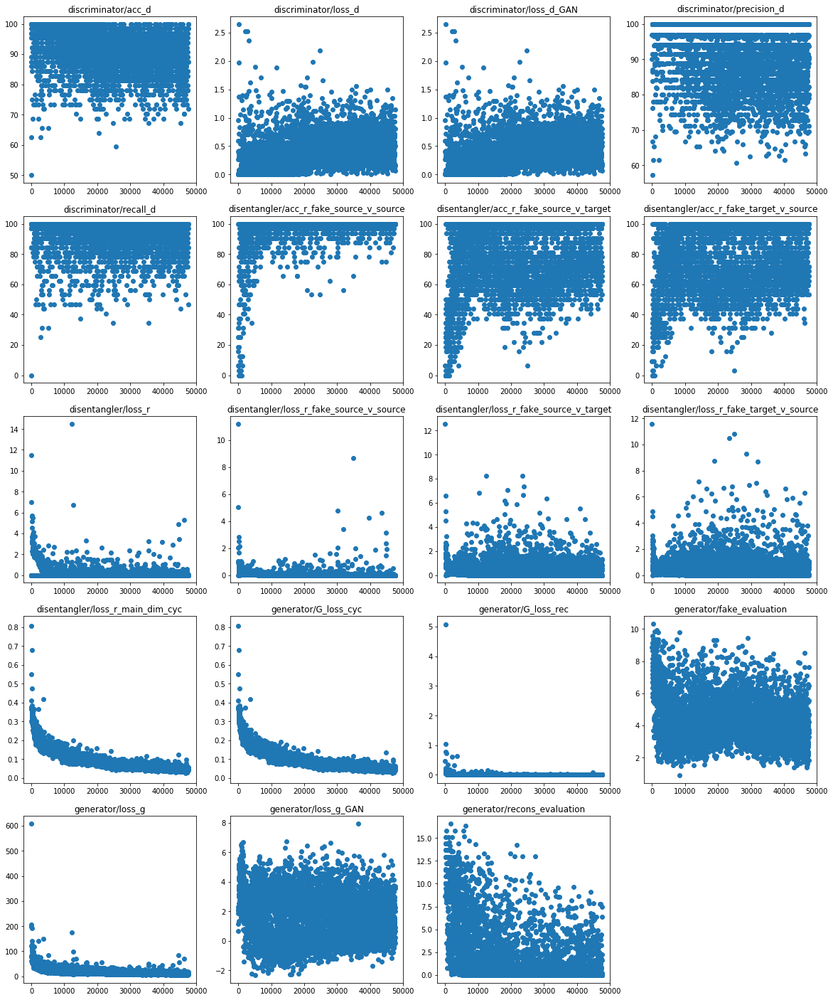

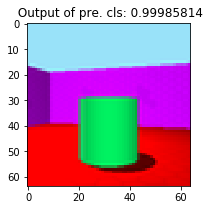

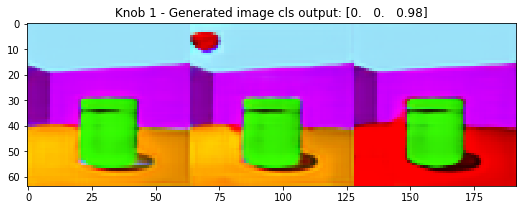

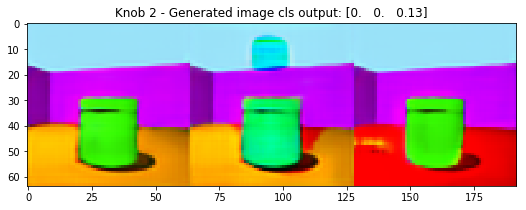

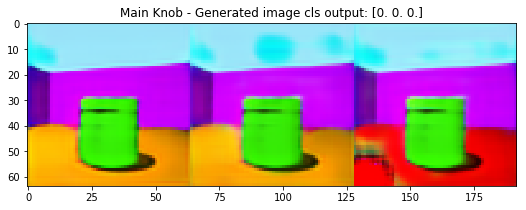

...

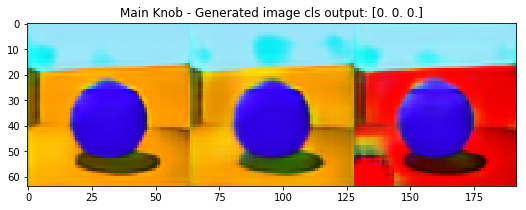

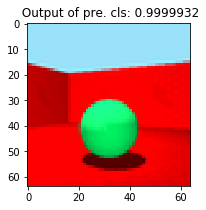

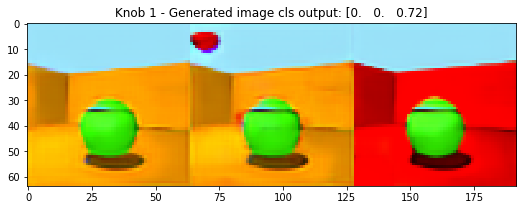

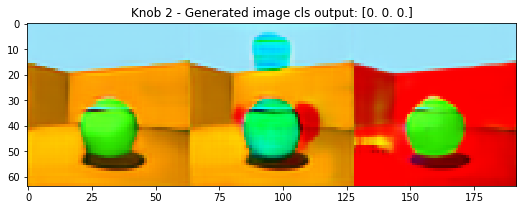

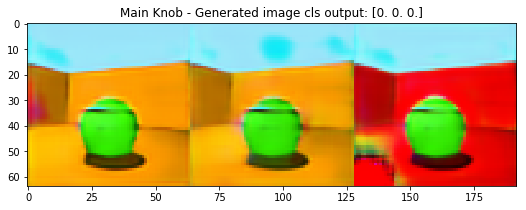

In [8]:
%%capture --no-display
view_images('./configs/redshapes_experiments/shapes_redcolor_Discoverer_2_dim_plus_r_10.yaml', 8)

INFO:tensorflow:Restoring parameters from ./output/discoverer/redshapes_experiments/shapes_redcolor_Discoverer_2_dim_plus_r_50/ckpt_dir/model48000.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/shapes-redcolor/cp1_epoch4.ckpt


<Figure size 432x288 with 0 Axes>

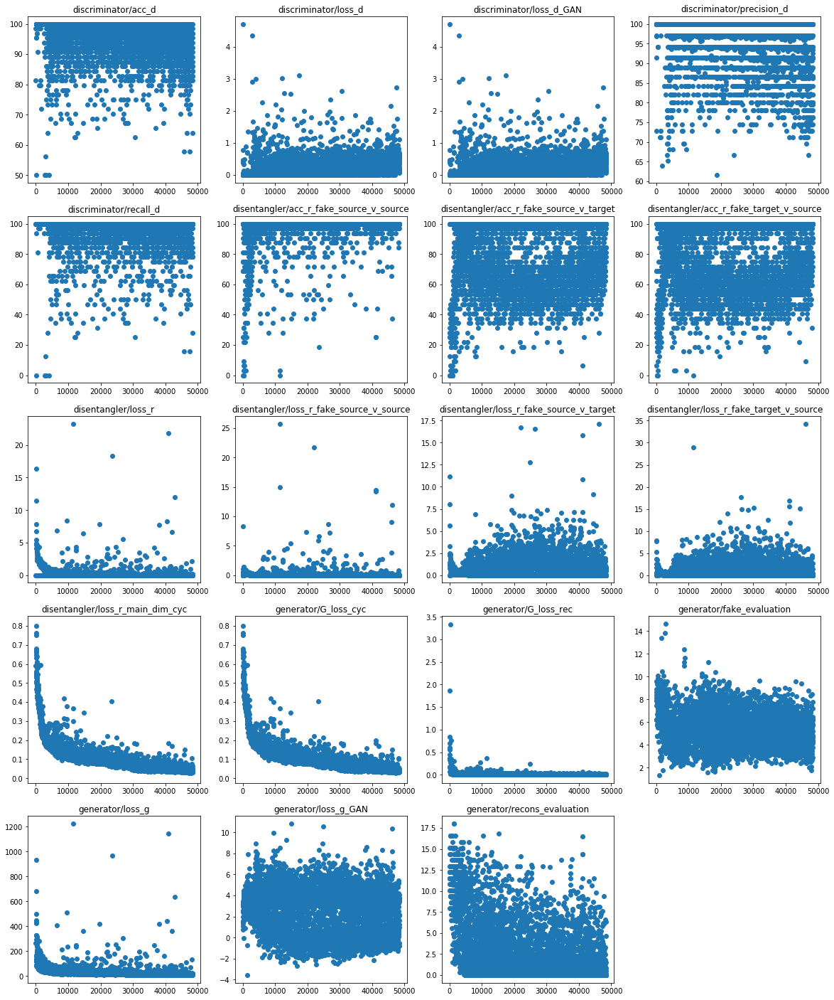

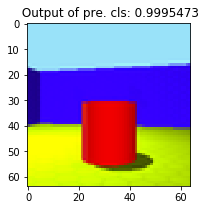

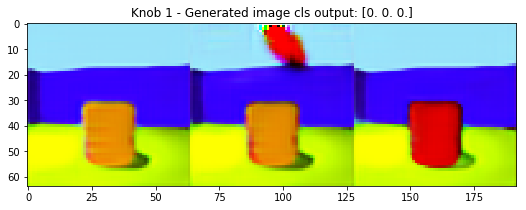

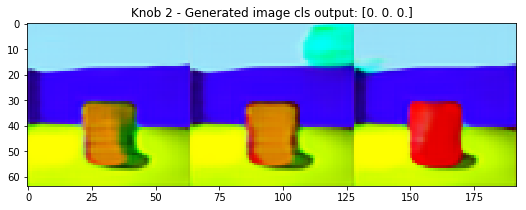

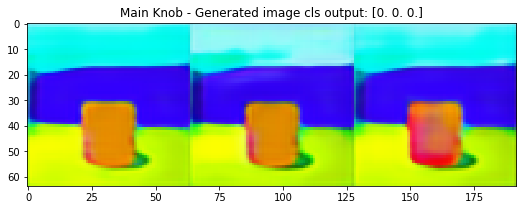

...

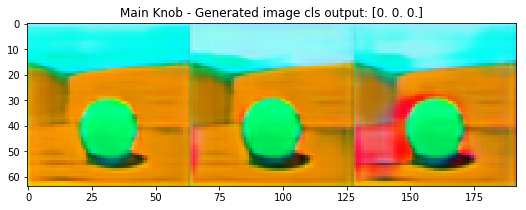

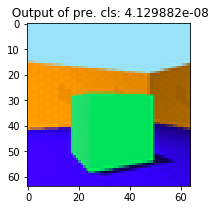

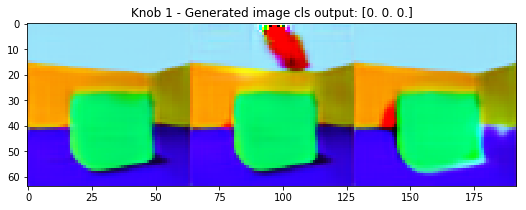

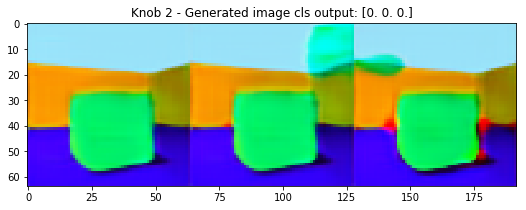

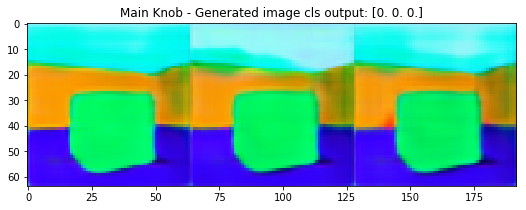

In [9]:
%%capture --no-display
view_images('./configs/redshapes_experiments/shapes_redcolor_Discoverer_2_dim_plus_r_50.yaml', 8)

## Shapes (classifier only trained for one epoch on a dataset of size ~ 10000)

Instructions for updating:
keep_dims is deprecated, use keepdims instead
INFO:tensorflow:Restoring parameters from ./output/explainer/shapes_red/shapes_redcolor_Explainer_newarch/ckpt_dir/model93500.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/shapes-redcolor_1/cp1_epoch0.ckpt


<Figure size 432x288 with 0 Axes>

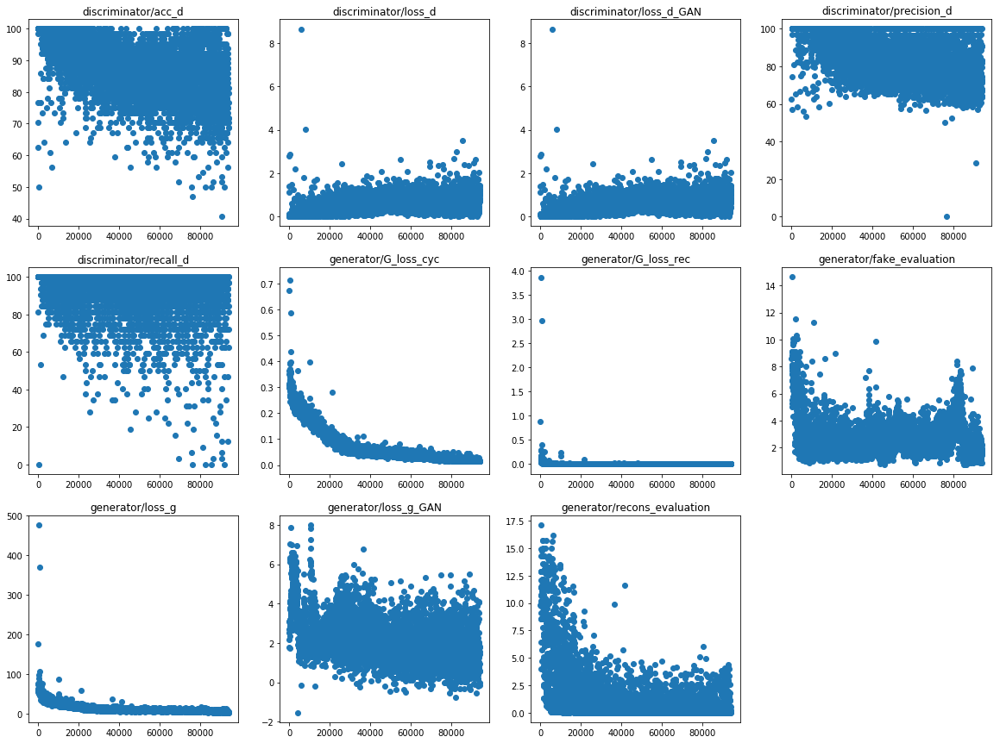

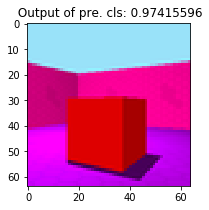

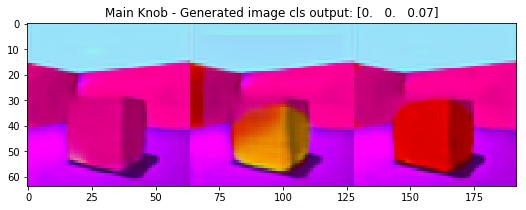

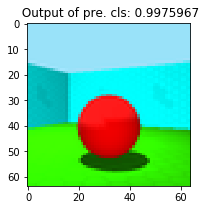

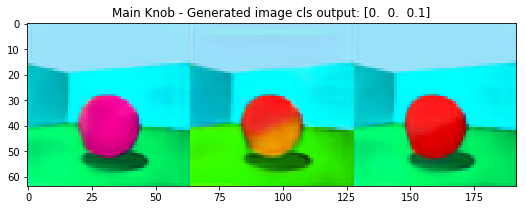

...

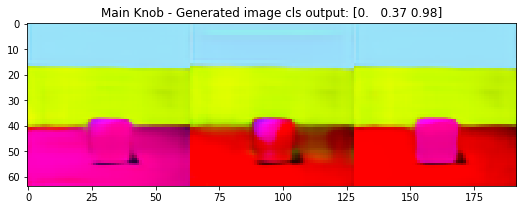

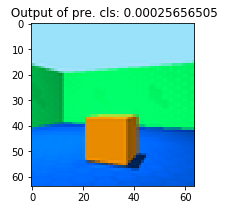

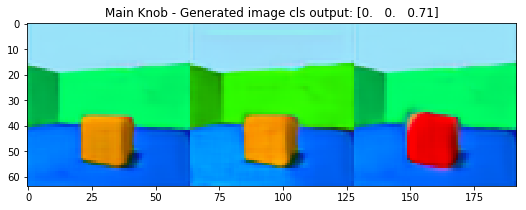

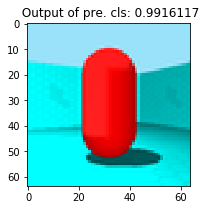

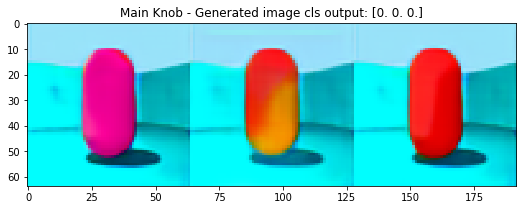

In [5]:
%%capture --no-display
# baseline
view_images('./configs/shapes_redcolor_Explainer_newarch.yaml', 8)

INFO:tensorflow:Restoring parameters from ./output/explainer/shapes_red/shapes-redcolor-Binary-Disentangled_2_newarch_r10/ckpt_dir/model93500.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/shapes-redcolor_1/cp1_epoch0.ckpt


<Figure size 432x288 with 0 Axes>

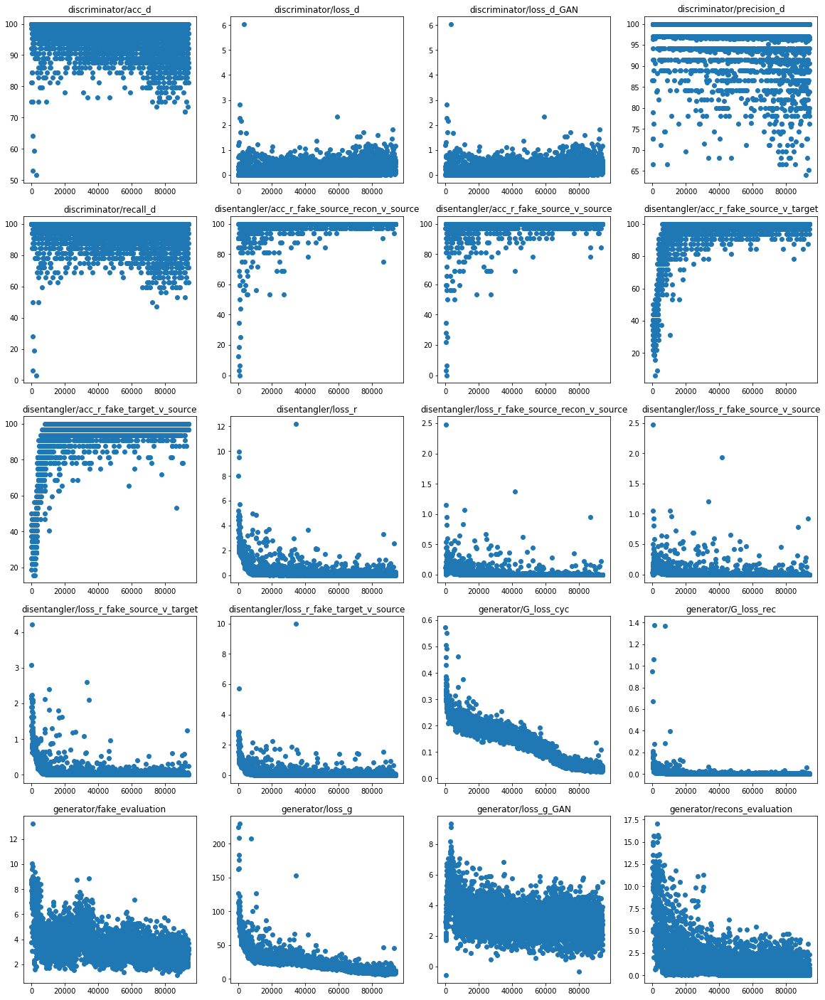

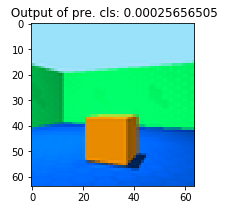

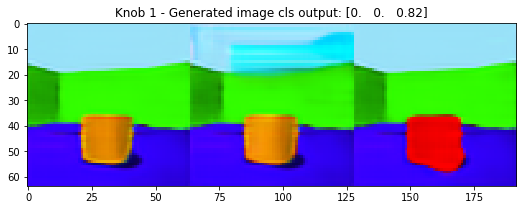

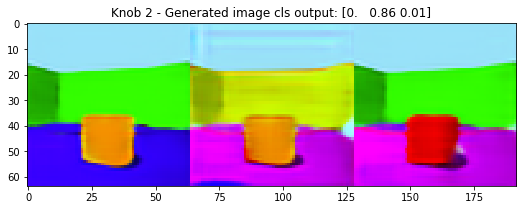

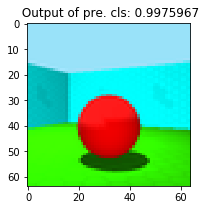

...

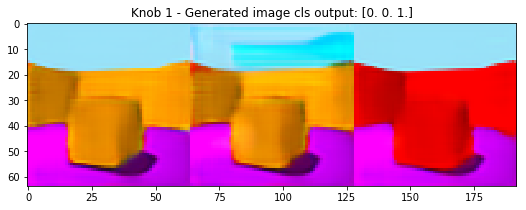

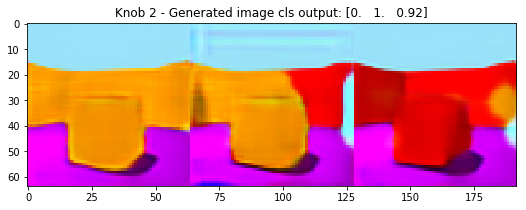

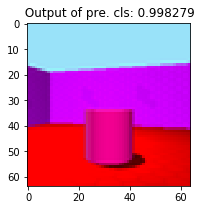

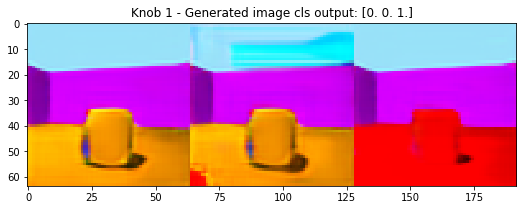

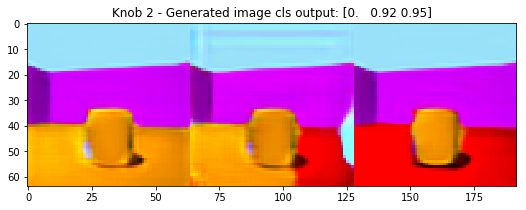

In [7]:
%%capture --no-display
# r 10
view_images('./configs/shapes_redcolor_Explainer_disentangled_2_newarch_r10.yaml', 8)

INFO:tensorflow:Restoring parameters from ./output/explainer/shapes_red/shapes-redcolor-Binary-Disentangled_2_newarch_gr/ckpt_dir/model93500.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/shapes-redcolor_1/cp1_epoch0.ckpt


<Figure size 432x288 with 0 Axes>

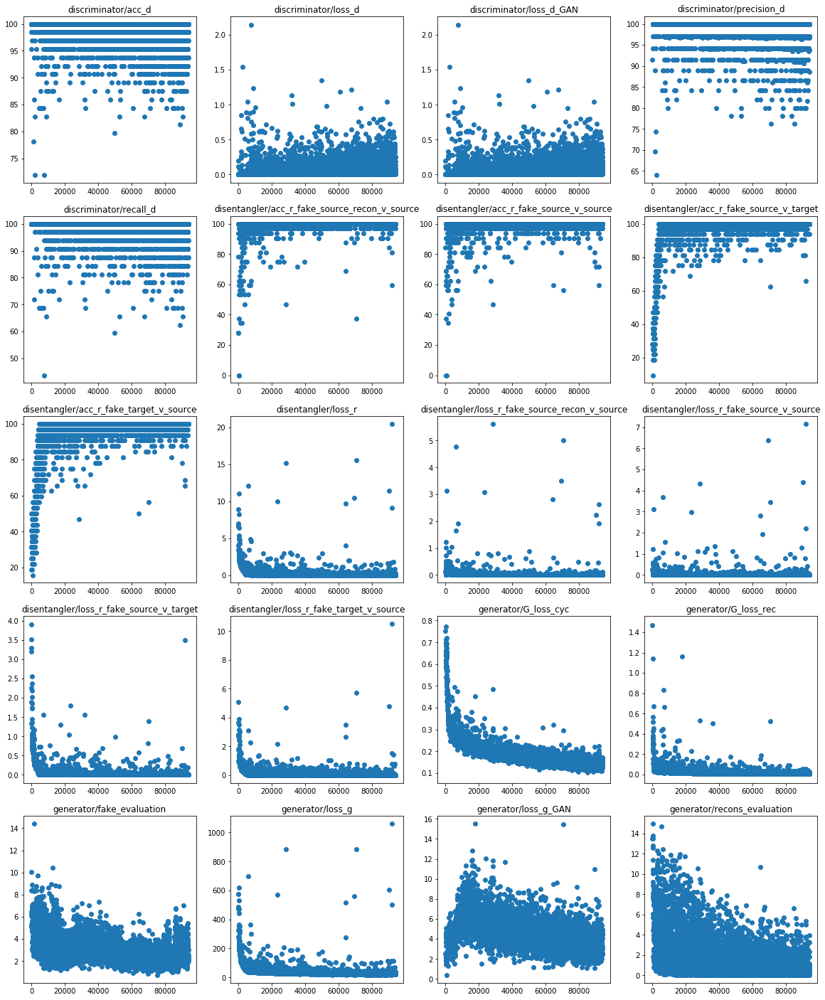

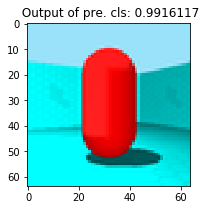

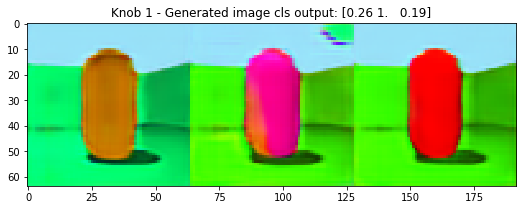

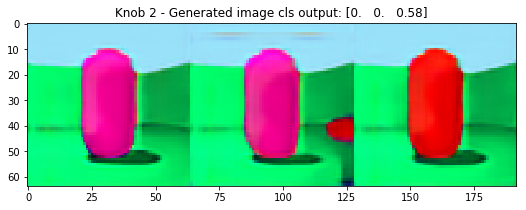

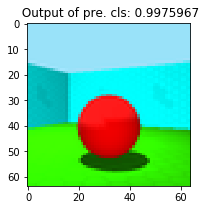

...

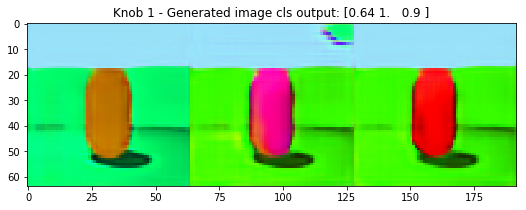

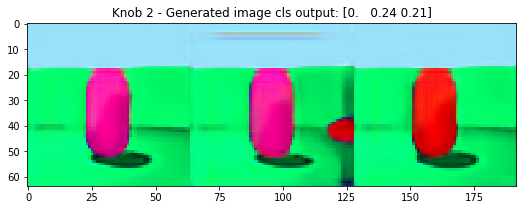

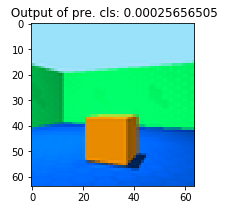

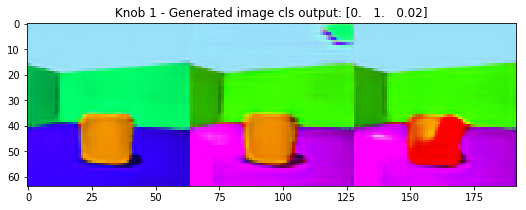

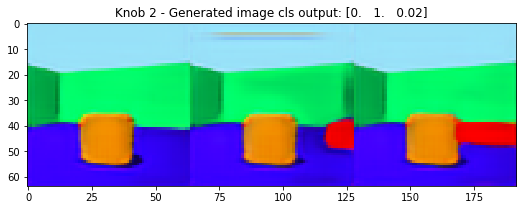

In [12]:
%%capture --no-display
# r 50
view_images('./configs/shapes_redcolor_Explainer_disentangled_2_newarch_gr.yaml', 8)

INFO:tensorflow:Restoring parameters from ./output/explainer/shapes_red/shapes-redcolor-Binary-Disentangled_2_main_dim/ckpt_dir/model61000.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/shapes-redcolor_1/cp1_epoch0.ckpt


<Figure size 432x288 with 0 Axes>

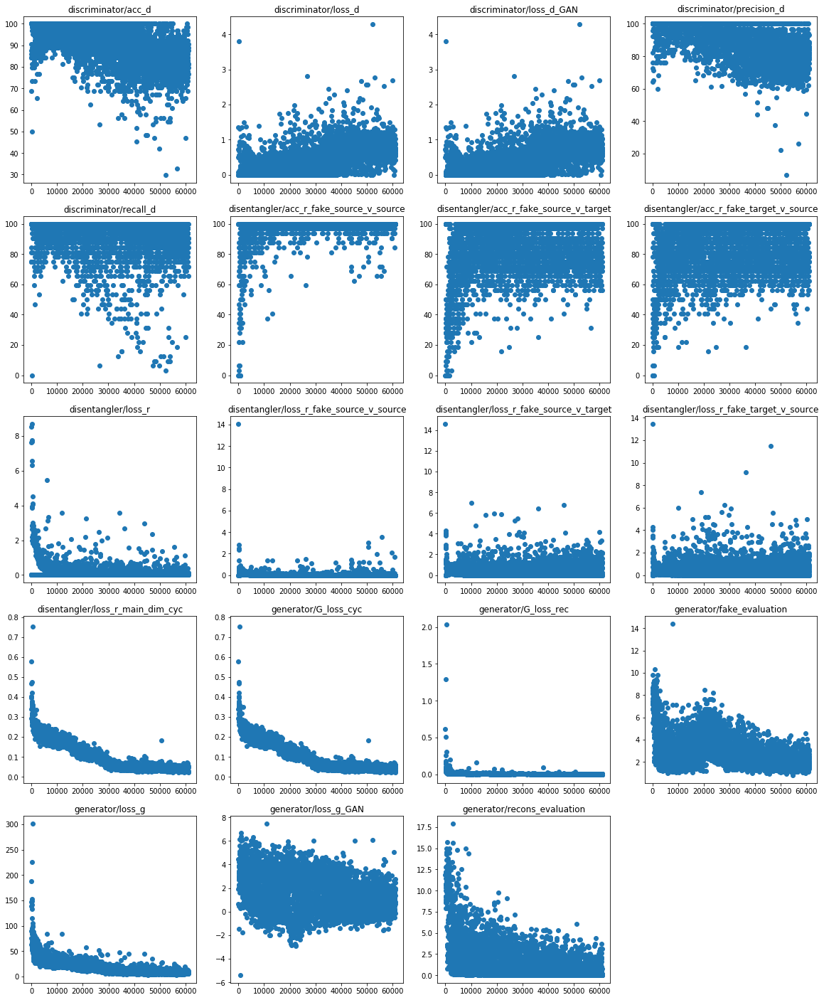

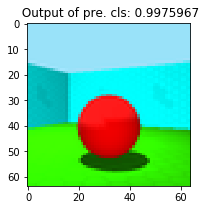

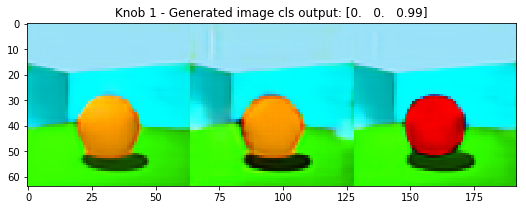

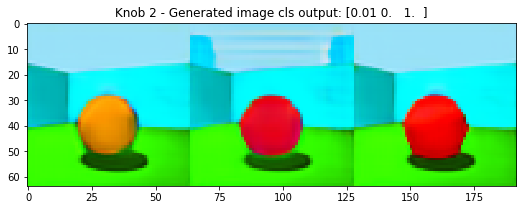

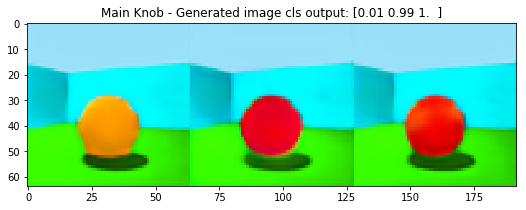

...

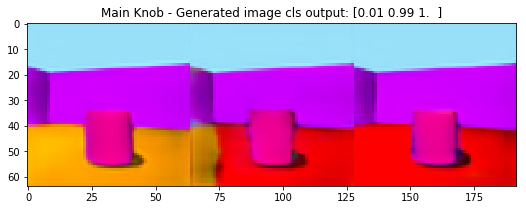

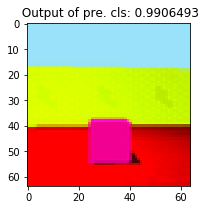

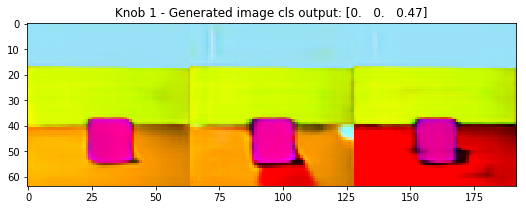

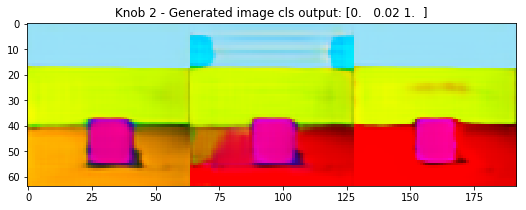

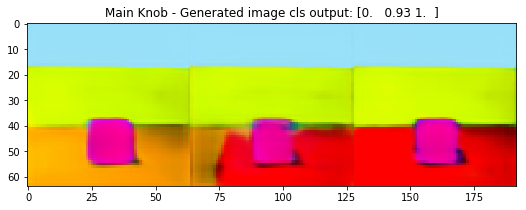

In [9]:
%%capture --no-display
# main dim r 10
view_images('./configs/shapes_redcolor_Explainer_disentangled_2_main_dim.yaml', 8)

INFO:tensorflow:Restoring parameters from ./output/explainer/shapes_red/shapes-redcolor-Binary-Disentangled_2_main_dim_r50/ckpt_dir/model73500.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/shapes-redcolor_1/cp1_epoch0.ckpt


<Figure size 432x288 with 0 Axes>

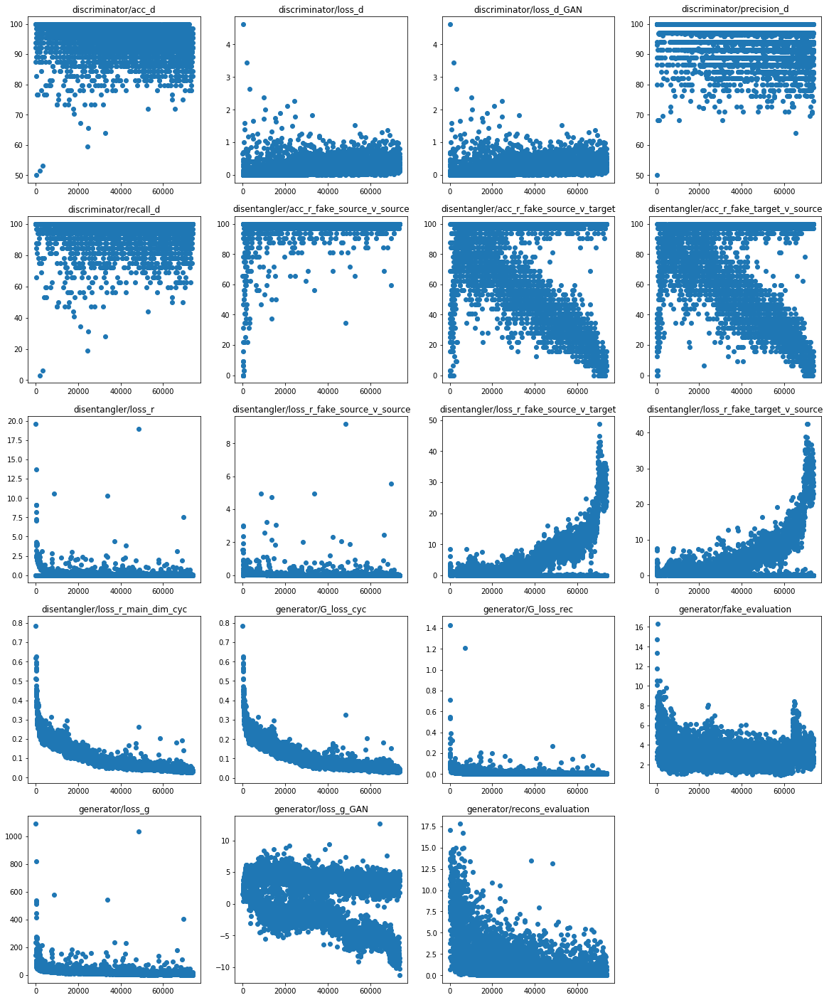

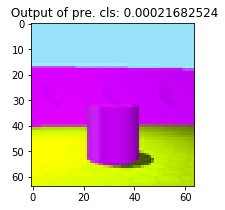

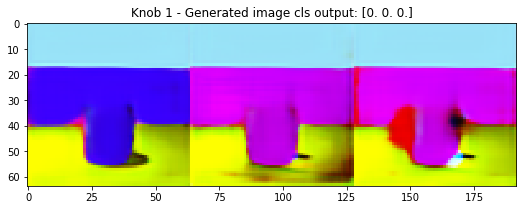

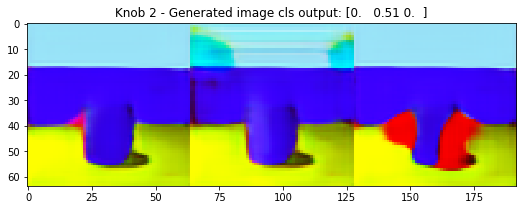

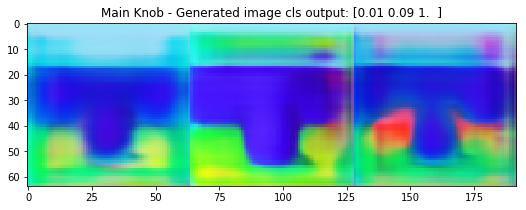

...

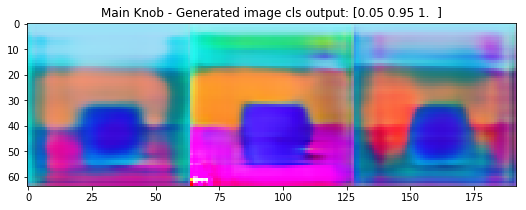

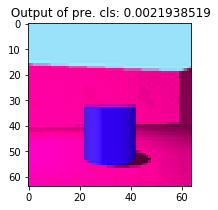

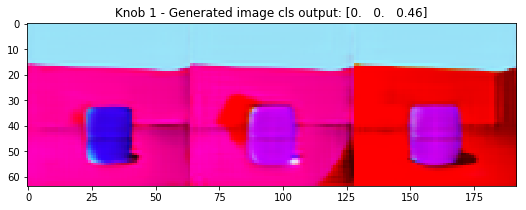

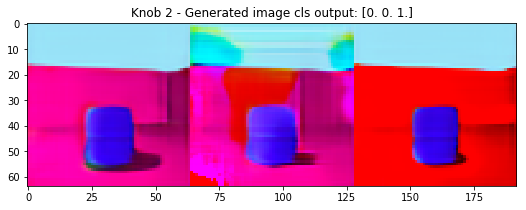

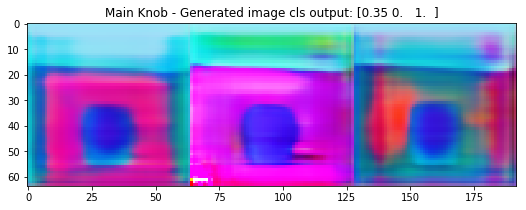

In [10]:
%%capture --no-display
# main dim r 50
view_images('./configs/shapes_redcolor_Explainer_disentangled_2_main_dim_r50.yaml', 8)

## CelebA

INFO:tensorflow:Restoring parameters from ./output/explainer/CelebA-Smile-Binary/ckpt_dir/model100001.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/CelebA-Smile/cp1_epoch4.ckpt


<Figure size 432x288 with 0 Axes>

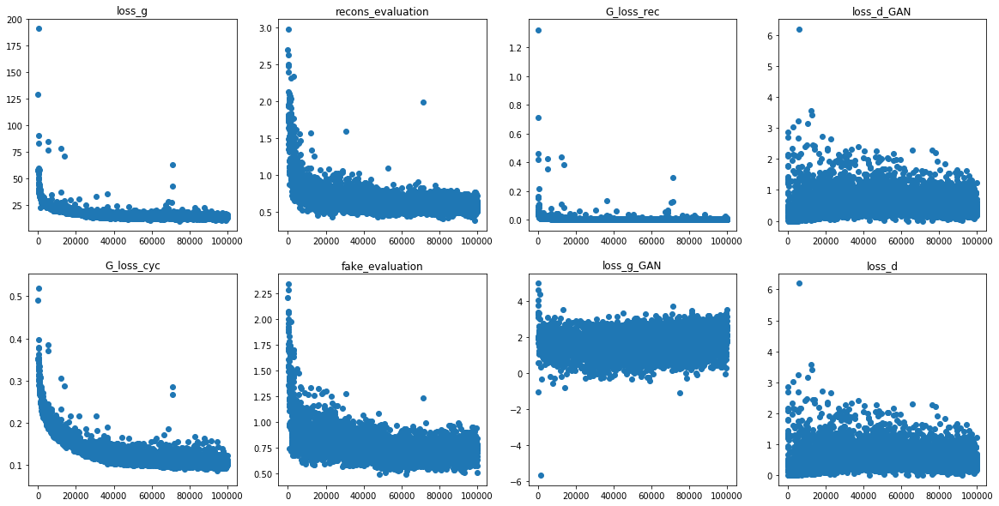

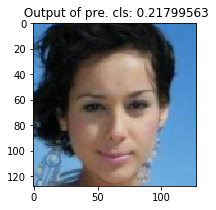

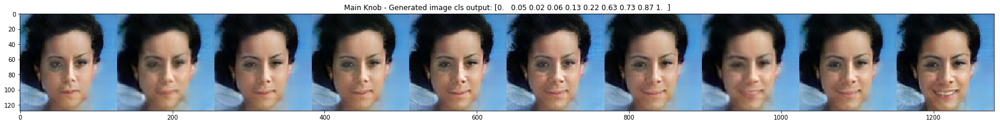

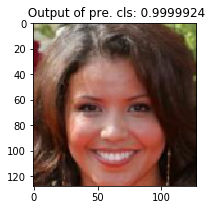

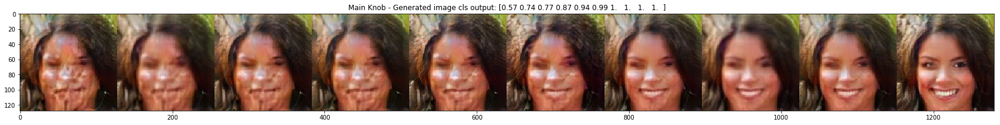

...

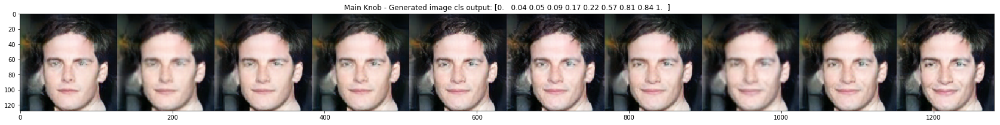

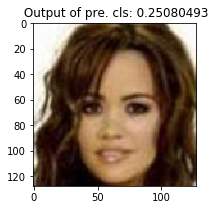

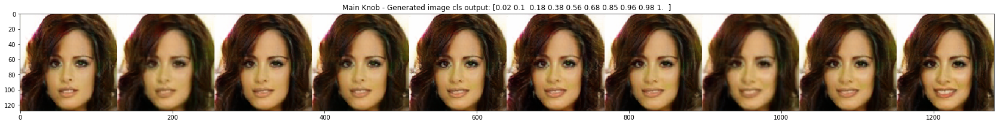

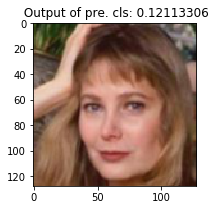

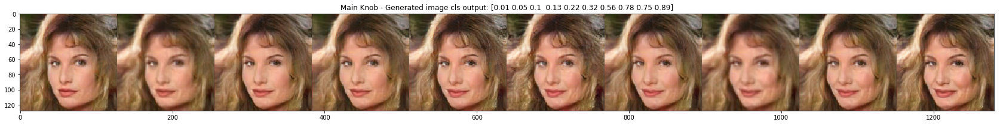

In [12]:
%%capture --no-display
view_images('./configs/celebA_Smile_Explainer.yaml', 8)

INFO:tensorflow:Restoring parameters from ./output/explainer/CelebA-Young-Binary/ckpt_dir/model100001.ckpt
INFO:tensorflow:Restoring parameters from ./output/classifier/CelebA-Young/cp1_epoch4.ckpt


<Figure size 432x288 with 0 Axes>

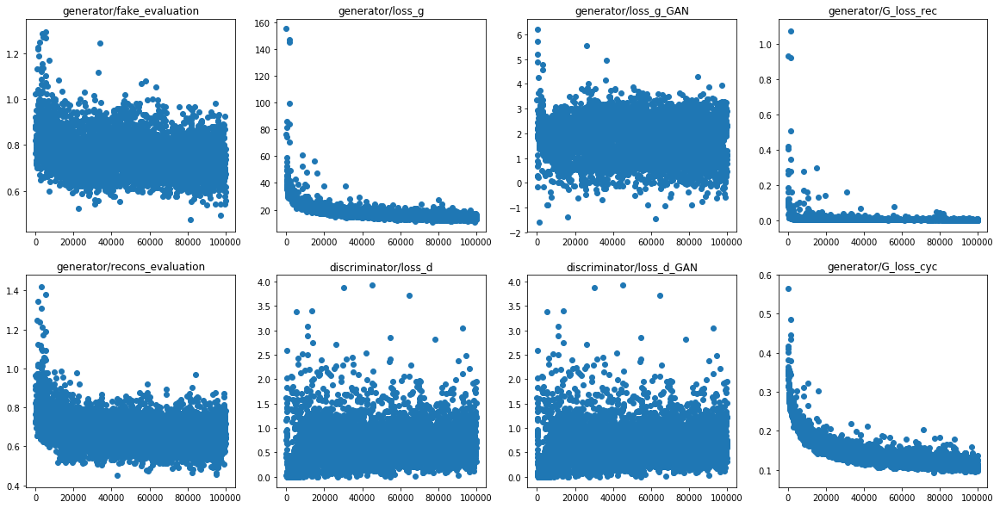

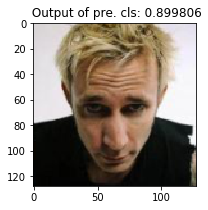

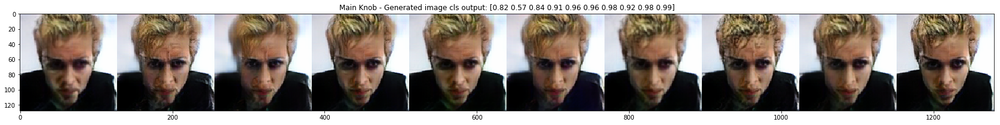

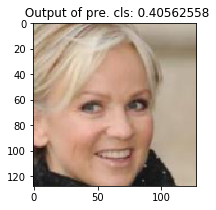

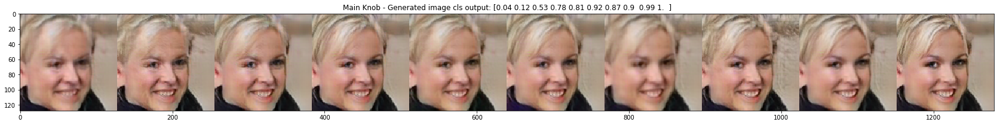

...

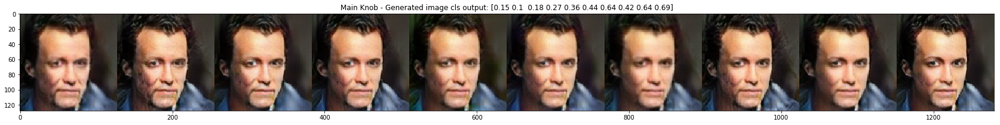

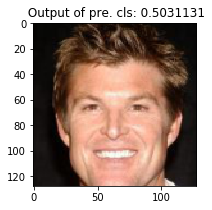

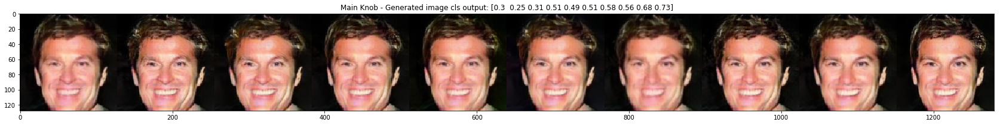

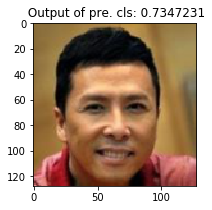

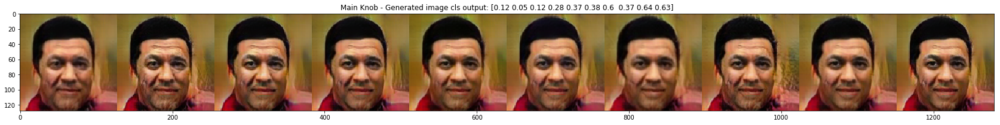

In [11]:
%%capture --no-display
view_images('./configs/celebA_Young_Explainer.yaml', 8)